# Capstone Project 1 
- Proposal
- Data Wrangling
- Story Telling
- Inferential Statistics
- Baseline Modeling
- Extended Modeling

## Proposal

#### What is the problem?
<p> predict the dignosis of patient from the data from fine needle aspiration that if the patient has brest cancer.</p>

#### Who is this for?
<p> This data can be used for a doctor to predict suspected cell before cell has been analyzed.</p>

#### Link
The data of fine needle aspiration can be found from: [Link](https://www.kaggle.com/uciml/breast-cancer-wisconsin-data).



#### Approches to this issue

<p>This is Supervised learning with classification.</p>
<p>We have assigned with given data to apply Supervised Learning.<br>
We will use past data patients who were diagnosed as Malignant or Benign to make a model to make a prediction. <br>
    Since target data is discrete(Mailgnant or Benign), target data is categoried as classification. </p>
<p>The first approch would be using Logisitic Regression since target data is classification.</p>


## Data Wrangling

Import data from the csv, and convert it to panda dataframe

In [31]:
import pandas as pd

#import data from csv file
df = pd.read_csv("breast-cancer-wisconsin.csv")

Check the dataframe data

In [33]:
#print the dimention of the data
print(df.shape)
#print the number of patients by finding the number of index in the data
print("number of patient in this data: " + str(len(df.index)))

(569, 33)
number of patient in this data: 569


<p>There should be following in this data<br>
- 33 features of data<br>
- 569 patients data<br>
</p>

Now lets check first 10 data to see how the table is formed

In [3]:
#Output first 10 data to see the how the data is formed

df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,NaN
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510,NaN
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720,NaN
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750,NaN


We will also check the last 10 data on table

In [4]:
#Output the last 10 data 
df.tail(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
559,925291,B,11.51,23.93,74.52,403.5,0.09261,0.10210,0.11120,0.04105,...,37.16,82.28,474.2,0.12980,0.25170,0.3630,0.09653,0.2112,0.08732,NaN
560,925292,B,14.05,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,...,33.17,100.20,706.7,0.12410,0.22640,0.1326,0.10480,0.2250,0.08321,NaN
561,925311,B,11.20,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.00000,...,38.30,75.19,439.6,0.09267,0.05494,0.0000,0.00000,0.1566,0.05905,NaN
562,925622,M,15.22,30.62,103.40,716.9,0.10480,0.20870,0.25500,0.09429,...,42.79,128.70,915.0,0.14170,0.79170,1.1700,0.23560,0.4089,0.14090,NaN
563,926125,M,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.14740,...,29.41,179.10,1819.0,0.14070,0.41860,0.6599,0.25420,0.2929,0.09873,NaN
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.22160,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.16280,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.14180,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.26500,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.00000,0.2871,0.07039,NaN


We can see fromn the above tables that column "Unnamed: 32" only has data "NaN"<br>
Mailgnants are represented as 'M' and Benigns are representated as 'B'

We will now check the column (feature) information <br>
We will check number of data and the data type of each column

In [5]:
#Output the data information of all the feature
#This will allows us to understand if conversion is necessary to int64 or float64
#Since diagnosis 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

### Clean the data

We will first check if there is any missing values in the data

In [6]:
#Check if there is any null value in the data
#Outputs sum number of null value in each features
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

All the features output 0 number of null values. There is no missing value values in this dataset

To clean the dataset we will remove "id" and "Unnamed: 32" fetures since these data do not contain any useful information for predicting diagnosis

In [7]:
#Dropping unnecessary feature
df = df.drop(columns = ['id','Unnamed: 32'])

We will now check if unnecessary columns (features) have been removed.

In [8]:
#Output column information again to check if the above column data are dropped
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

Above table shows columns has been removed from dataframe

## Story telling


In [9]:
#Import necessary library
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import math

#### The separation between M and B
Finding the characteristic difference of M and B in diagnosis figure.


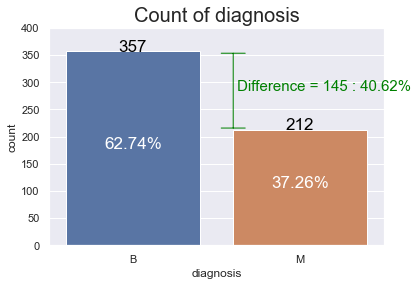

In [29]:
#Output the total number of possible output from 'diagnosis'
diagnosis_Count = df['diagnosis'].value_counts()
Y_M = diagnosis_Count['M']
Y_B = diagnosis_Count['B']
#Output the sum number of possible outcome by fist converting it to numpy to use sum()
diagnosis_Sum = diagnosis_Count.to_numpy().sum()
#Calculate the difference between the count 'B' and 'M'
diff_M_B = Y_B - Y_M
#Convert the difference to percentage
diff_M_B_per = diff_M_B / Y_B * 100
#Allow the percentage to show last 2 decimal places
diff_M_B_per_form = "{:.2f}".format(diff_M_B_per)

#Set aspect of visual theme for all matplotlib and seaborn plots.
sns.set_theme()
#Plot countplot of "diagnosis"
tar_class_his = sns.countplot(x = 'diagnosis', data = df, order = diagnosis_Count.index)
#Set the limit of the graph from 0 to 400
plt.ylim(0,400)

# Add text to the graph for easier visualization of the data
# for loop with the number of data of diagnosis_Count
# This for loop will display text of total number of each classification result of 'diagnosis'
# percentage compare to total number of data
for i in range(len(diagnosis_Count)):
    Act_Count = diagnosis_Count[i]
    Per_Count = Act_Count /diagnosis_Sum*100
    Per_Count_format = "{:.2f}".format(Per_Count)
    #Add Text to the graph
    #Acutal number of data
    tar_class_his.text(i, Act_Count, str(Act_Count), horizontalalignment = 'center', 
                       size = 17, color = 'black')
    #Percentage of number of data compaire to total number
    tar_class_his.text(i, (Act_Count /2), (str(Per_Count_format) + '%'), horizontalalignment = 'center', 
                       size = 17, color = 'White')

#Add a line to the graph for better visualization
#This line will represent the difference between B and M and the percentage difference respect to B
#Output patch (square on count graph) of tar_class_his patch
p = tar_class_his.patches


diff_posx = p[len(diagnosis_Count) - 1].get_x() 
diff_y = Y_B - Y_M
#Annotate will insert text and line to the graph
plt.annotate("", 
             xy = (diff_posx, Y_M), xytext = (diff_posx, Y_B), 
             arrowprops = dict(arrowstyle = '|-|', color = 'green'))

plt.annotate((" Difference = " + str(diff_M_B) + ' : ' + str(diff_M_B_per_form) + '%'), 
             xy = (diff_posx, (diff_y / 2 + Y_M)), xycoords = "data", 
             color = 'green', size = 15)
#Add titile
plt.title('Count of diagnosis', size = 20)
fig = tar_class_his.get_figure()
fig.savefig("output1.png")
plt.show()

The above graph describe the following:<br>
* The target variable has unbalanced data between number of Mailgnant and Benign.
* Mailgnant: There are 212 patients which are 37.26% in the data
* Benign:  There are 357 patients which are 62.74% in the data
* The difference of Mailgnant and Benign is 145 patients
* The difference is 59.38% of whole patient population
    * where:
    M = Malignant
    B = Benign

#### Checking the distribution of data using histogram


Plot histogram of all columns with separating by target feature "dignosis" result (M as Mailgnant and B as Benign) to understand how each features's diagnosis are distrbuted

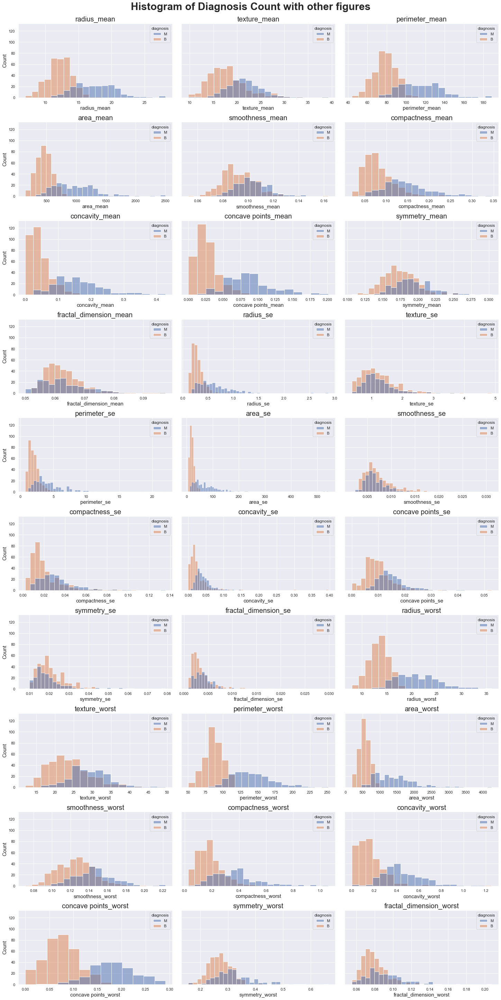

In [11]:
#Create a list of features
column_extract = df.columns[1:].to_list()
#Design subplot
fig, ax =plt.subplots(nrows= 10, ncols= 3, figsize = (20,40), constrained_layout=True, sharey=True)
#Subplot count
z = 0
fig.suptitle('Histogram of Diagnosis Count with other figures', fontsize = 30, weight = 'bold')

#for loop: 
# Output: histogram of diagnosis result: M and B of each features
for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
            hist_plot = sns.histplot(df, x = column_extract[z], hue = "diagnosis", ax = ax[i][j] )
            hist_plot.set_title(column_extract[z], size = 20)
            hist_plot.set_xlabel(xlabel= column_extract[z], fontsize =15)
            hist_plot.set_ylabel(ylabel= 'Count', fontsize =15)
            z += 1

fig = hist_plot.get_figure()
fig.savefig("output2.png")

plt.show()

there are similarity of the pattern in the distribution such as "compactness_worst" and "concavity_wrst"

### Standardization

Since the x axis scale of each feature is different, it is difficult to distinguish the similarity. <br>
Standardization for all the feature for better understanding of the data with separating the diagnosis<br>


![image](https://www.atoti.io/wp-content/uploads/2021/01/1_6TnJHNoeu9ZSni1B94MZow.png)

In [12]:
#create dataframe with dropping "Diagnosis" column
features = df.drop(labels = "diagnosis", axis = 1)
#Create target column
target = df["diagnosis"]
#Use above equation to find standardization of each data
standar = (features - features.mean()) / features.std()
#Add target column to the dataframe
standar_data = pd.concat([target, standar], axis =1)
#Melt to devide all the data with Diagnosis result and its feature and the result of standardization
standar_data_m = pd.melt(standar_data,id_vars='diagnosis',var_name='features',value_name='value')

Plot Violine plot to see the density characteristic of each feature and box plot for the distribution

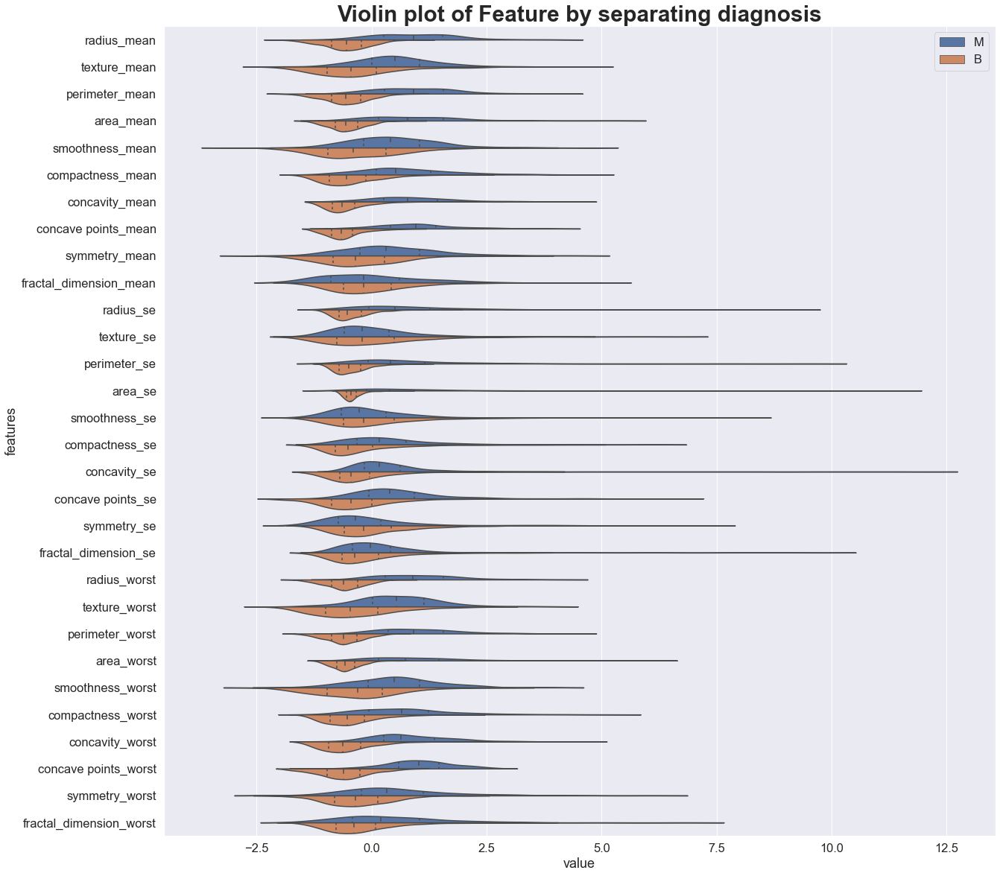

In [13]:
plt.figure(figsize=(20,20))
sns.set_context(context = 'notebook', font_scale=1.5)
#Plot violine plot
violinplt = sns.violinplot(x='value', y= 'features', data = standar_data_m, hue = 'diagnosis',split = True, inner = 'quart')
#Add legend to the graph in order to present color meaning
plt.legend()
plt.title('Violin plot of Feature by separating diagnosis',fontsize = 30, weight = 'bold')
fig = violinplt.get_figure()
fig.savefig("output3.png")
plt.show()

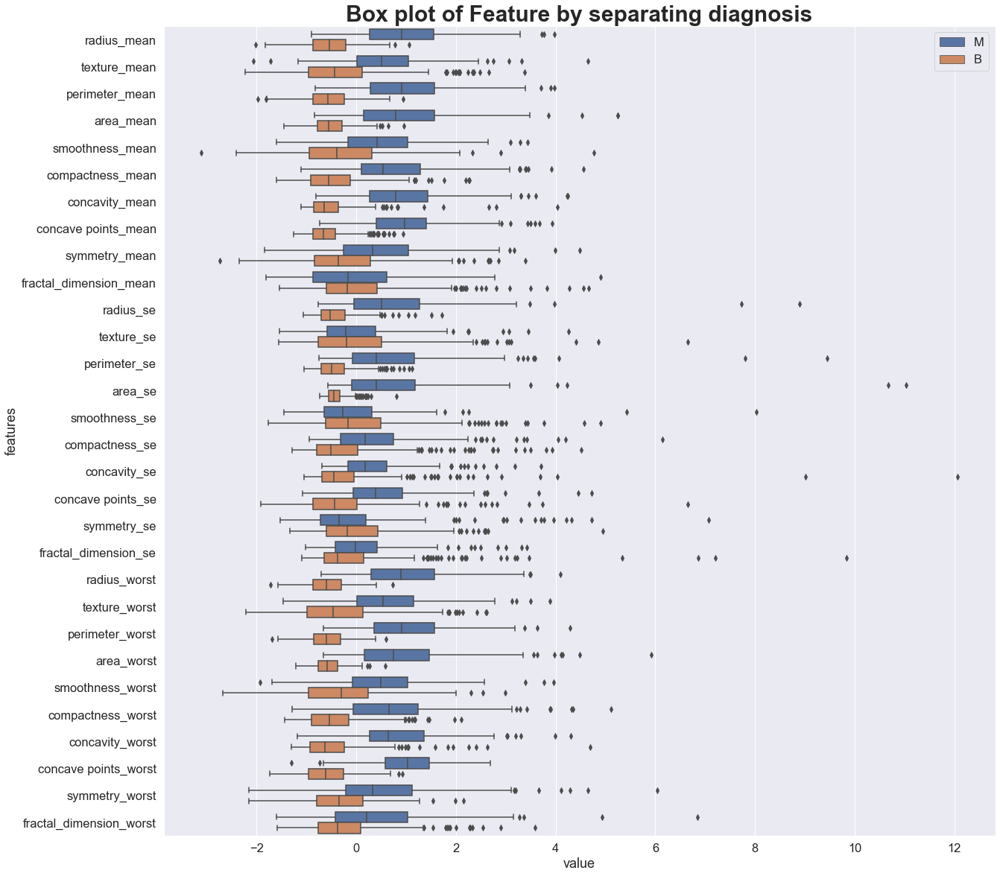

In [14]:
#Fix the size of the graph
plt.figure(figsize=(20,20))
sns.set_context(context = 'notebook', font_scale=1.5)
#plot box plot of each features
boxplt = sns.boxplot(x='value', y= 'features', data = standar_data_m, hue = 'diagnosis')
plt.legend()
plt.title('Box plot of Feature by separating diagnosis',fontsize = 30, weight = 'bold')
fig = boxplt.get_figure()
fig.savefig("output4.png")
plt.show()

With Violine and box plot, we can see that some of the features has similar distribution such as "smoothness_se" and "symmetry_se".<br>
Also, Mailgnant and Benign of "smoothness_se" and "symmetry_se" have very similar pattern, therefore, correlation might be low.
Whereas, Mailgnant and Benign of "concave points_worst" has similar pattern of distrbution with different mean. Since Mailgnant and Benign means are separated the correlation might be high.

### Correlation

I would now like to find the correlation of each features to distinguish which features might be using heat map.

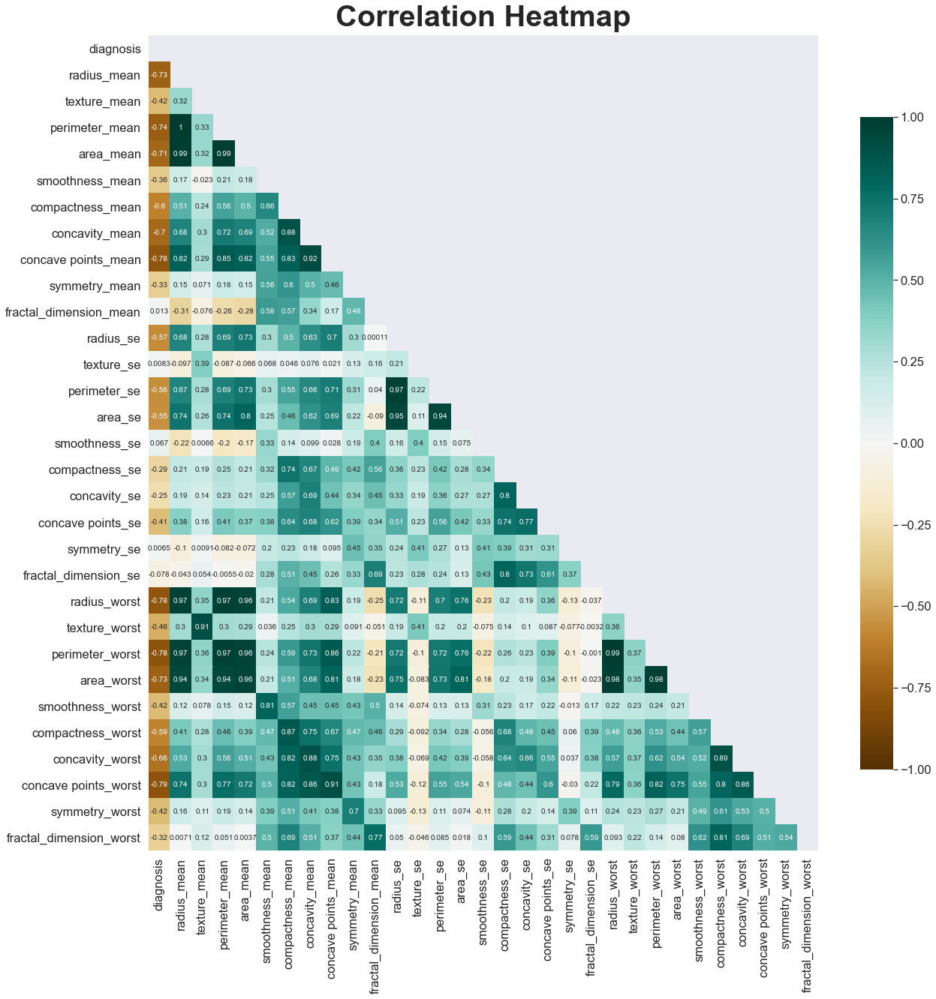

In [15]:
plt.figure(figsize = (20,20))
#Change 'diagnosis' data to numerical since heatplot needs all the data to be numerical data.
eva_df = df.replace({'diagnosis' : ['M','B']}, {'diagnosis' : [0,1]})
#Form array into matrix form with correlation result 
mask = np.triu(np.ones_like(eva_df.corr()))
#Plot heatmap with masking the same result using mask data
corr_heatmap = sns.heatmap(eva_df.corr(), mask=mask, vmin = -1, vmax = 1, annot = True, annot_kws={"size": 10},
                           cmap = 'BrBG',cbar_kws={"shrink": 0.8})
#Add title to the graph
corr_heatmap.set_title('Correlation Heatmap', fontdict = {'fontsize':40, 'weight':'bold'}, pad = 12)
fig = corr_heatmap.get_figure()
fig.savefig("output5.png")
plt.show()

Abstract diagnosis correlation with other features for more clear understanding of the result

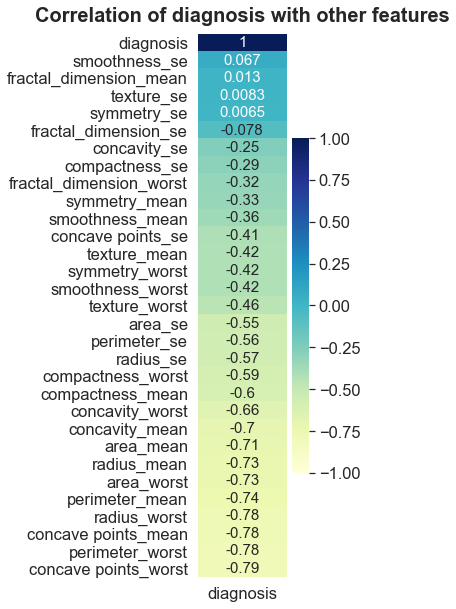

In [16]:
#Fix the graph size
fig, ax = plt.subplots(figsize = (2,10))
#Re-order the result with decending order
diag_corr = eva_df.corr()[['diagnosis']].sort_values(by ='diagnosis', ascending = False)
#Draw the graph with heatmap
diag_corr_heatmap = sns.heatmap(diag_corr, vmin = -1, vmax = 1, annot = True, annot_kws = {'size' : 15}, cmap="YlGnBu",
                               ax = ax)
#Add title to the graoh
diag_corr_heatmap.set_title('Correlation of diagnosis with other features', fontdict = {'fontsize':20, 'weight':'bold'}, pad = 12)
fig = diag_corr_heatmap.get_figure()
fig.savefig("output6.png")
plt.show()

Highest correlation of feature is "concave points_worst" with negative correlation of -0.79<br>
The lowest correlation of feature is "symmetry_se" with positive correlation of 0.0065

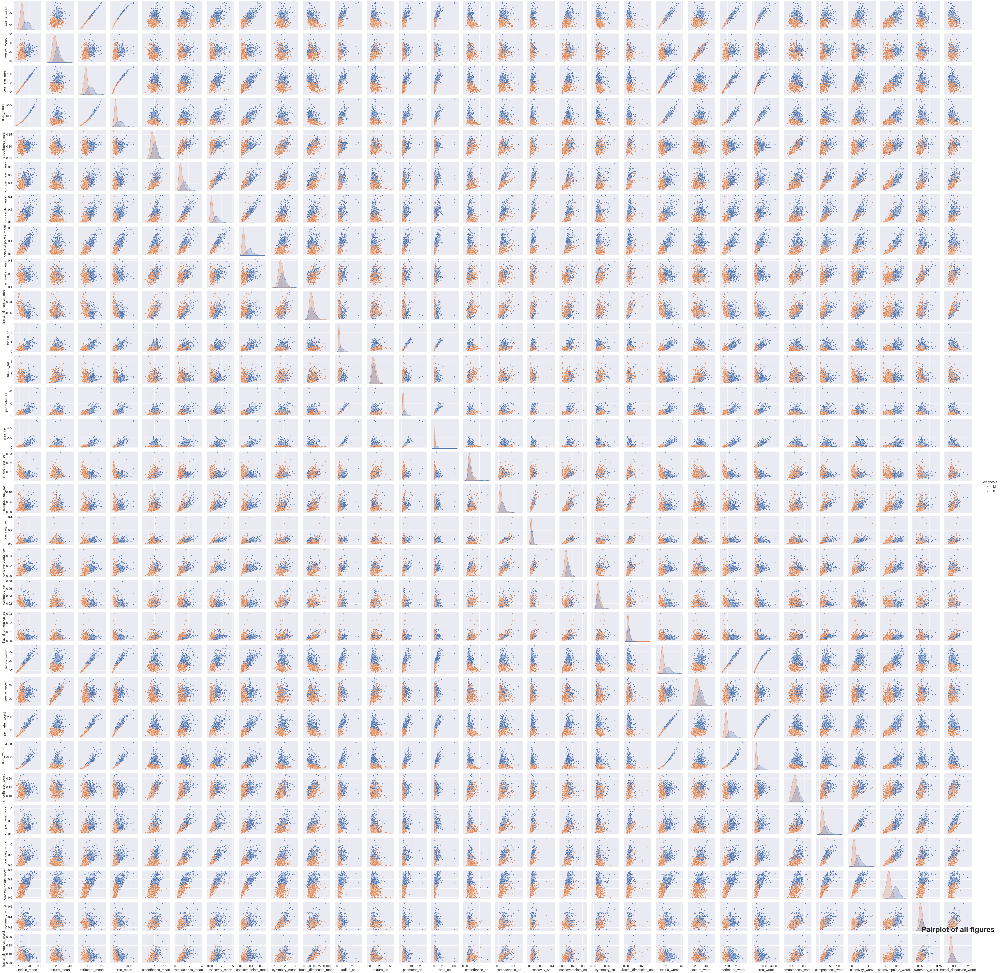

In [17]:
pair_plot = sns.pairplot(df, hue = "diagnosis" )
plt.title('Pairplot of all figures', fontdict = {'fontsize':40, 'weight':'bold'}, pad = 12)
fig = pair_plot.fig
fig.savefig("output7.png")
plt.show()

## Inferential Statistics

### ECDF comparison

In [18]:
diag_r2 = pd.DataFrame(data = diag_corr)
diag_r2['r2'] = diag_corr['diagnosis']**2
diag_r2.drop('diagnosis').rename(columns={'diagnosis':'correlation'}).sort_values(by = 'r2', ascending= False)

,correlation,r2
concave points_worst,-0.793566,0.629747
perimeter_worst,-0.782914,0.612955
concave points_mean,-0.776614,0.603129
radius_worst,-0.776454,0.602880
perimeter_mean,-0.742636,0.551508
area_worst,-0.733825,0.538499
radius_mean,-0.730029,0.532942
area_mean,-0.708984,0.502658
concavity_mean,-0.696360,0.484917
concavity_worst,-0.659610,0.435086


We can see that 'concave points_worst' has statistically significant with highest correlation and <br>
'symmetry_se' has the lowest correlation.

In [19]:
#This funtion will output x and y coordinate of ECDF(Empirical distribution function)
def ECDF(df):
    x = np.sort(df)
    y = np.arange(1, len(x) +1) / len(x)
    return x, y

#This function will output graph of ECDF with input of x and y values for M and B 
def plot_ECDF(Mx, My, Bx, By, x_la, Title):
    plt.plot(Mx,My, marker = '.', linestyle ='none', color ='blue', label ='M')
    plt.plot(Bx,By, marker = '.', linestyle ='none', color ='red', label ='B')
    plt.xlabel(xlabel = x_la, size = 20)
    plt.ylabel(ylabel = 'ECDF', size = 20)
    plt.title(label = Title, size = 20)
    plt.legend(prop = {'size':15})
    plt.savefig("output8")

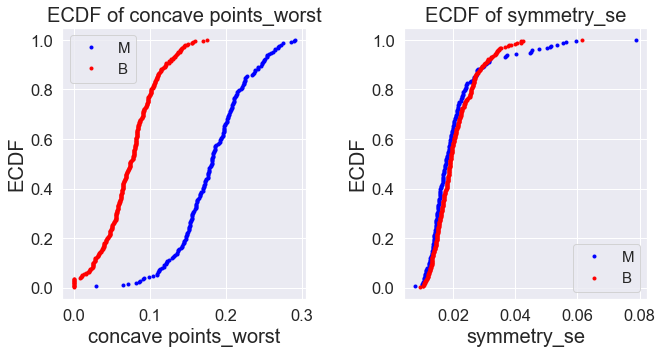

In [20]:
#Create a dataframe with 'concave points_worst'
df_2 = df['concave points_worst']
#Create separate dataframe for M and B
df_2_M = df_2[df['diagnosis']=='M']
df_2_B = df_2[df['diagnosis']=='B']
xM1, yM1 = ECDF(df_2_M)
xB1, yB1 = ECDF(df_2_B)

#Create a dataframe with 'symmetry_se'
df_3 = df['symmetry_se']
#Create separate dataframe for M and B
df_3_M = df_3[df['diagnosis']=='M']
df_3_B = df_3[df['diagnosis']=='B']
xM2, yM2 = ECDF(df_3_M)
xB2, yB2 = ECDF(df_3_B)

#Set the graph size
plt.figure(figsize = (10,10))
#Set the subplot position
plt.subplot(2,2,1)
#Plot the graph using the function that I created
plot_ECDF(xM1, yM1,xB1, yB1,'concave points_worst','ECDF of concave points_worst')

#Set the subplot position
plt.subplot(2,2,2)
#Plot the graph using the function that I created
pltECDF = plot_ECDF(xM2, yM2, xB2, yB2,'symmetry_se','ECDF of symmetry_se')

plt.tight_layout(pad = 2)

 I have compaired the highest and lowest correlation with empirical cumulative distribution of features(ECDF)<br>
We can see that 'symmetry_se' Malignant and Benign has very similar distribution unable to distinguish disgnosis from this data.

## Evaluation

I will now separate the data into test data and train data with testing size to be 30% of whole data.<br>
Since the data is unbalanced between Mailgnant and Benign, we will make sure the data is separated with same ratio with "strarify =y

In [21]:
from sklearn.model_selection import train_test_split

#Set x as feature data
x = df.drop(labels = "diagnosis", axis = 1)
#Set y as target data
y = df["diagnosis"]
#Split the data and make sure to 'stratify' = y since the diagnosis data is unbalanced
#'stratify' = y : it will allow data to split proportion to the actual value
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size = 0.3, random_state = 1, stratify=y)

We will fit the data with different models using splited train data

## Baseline Modeling

Since the target data has binary classification. M and B<br>
Therefore, we will apply Logistic Regaression algorithm as baseline model.

### Logistic Regression

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,plot_confusion_matrix, accuracy_score, classification_report, precision_score, recall_score, f1_score


log_model = LogisticRegression()
clf = log_model.fit(X_train, Y_train)

#Predicition of Y train
Y_Log_train_pre = log_model.predict(X_train)
#Predicition of Y test
Y_Log_test_pre = log_model.predict(X_test)
#Create classfication report with dictionary output
cr_log_test = classification_report(Y_test,Y_Log_test_pre, output_dict = True)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [23]:
print(classification_report(Y_train, Y_Log_train_pre))

              precision    recall  f1-score   support

           B       0.96      0.97      0.96       250
           M       0.94      0.93      0.94       148

    accuracy                           0.95       398
   macro avg       0.95      0.95      0.95       398
weighted avg       0.95      0.95      0.95       398



In [24]:
print(classification_report(Y_test, Y_Log_test_pre))

              precision    recall  f1-score   support

           B       0.94      0.98      0.96       107
           M       0.97      0.89      0.93        64

    accuracy                           0.95       171
   macro avg       0.95      0.94      0.94       171
weighted avg       0.95      0.95      0.95       171



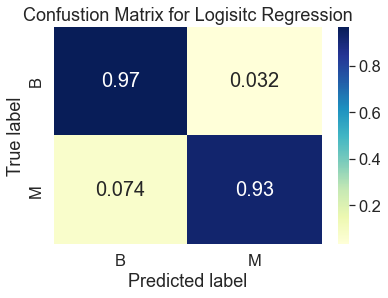

In [25]:
cm = confusion_matrix(Y_train, Y_Log_train_pre, labels = ['B','M'])
cm_percent = cm / cm.sum(axis = 1).reshape(-1,1)

labels = ['B','M']
lg_heat = sns.heatmap(cm_percent, annot = True, cmap="YlGnBu", annot_kws = {'size' : 20},xticklabels = labels, yticklabels = labels)

plt.title("Confustion Matrix for Logisitc Regression")
plt.xlabel("Predicted label")
plt.ylabel("True label")
fig = lg_heat.get_figure()
fig.savefig("output9")

## Extended Modeling

Apply other models that can be used for binary classification. Such as Decision Tree, SVM, Random Forest.

### Decision Tree

In [26]:
from sklearn import tree

In [27]:
tree_model = tree.DecisionTreeClassifier()
clf_tree = tree_model.fit(X_train, Y_train)

#Predicition of Y test
Y_Tree_test_pre = tree_model.predict(X_test)
#Create classfication report with dictionary output
cr_tree_test = classification_report(Y_test,Y_Tree_test_pre, output_dict = True)

In [28]:
#Print the classification report
print(classification_report(Y_test,Y_Tree_test_pre))

              precision    recall  f1-score   support

           B       0.92      0.96      0.94       107
           M       0.93      0.86      0.89        64

    accuracy                           0.92       171
   macro avg       0.93      0.91      0.92       171
weighted avg       0.92      0.92      0.92       171



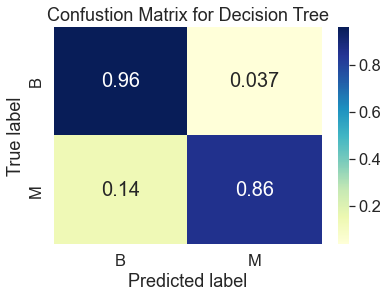

In [29]:
#Create confustion matrix using Y test data and predicted data using X test data
cm = confusion_matrix(Y_test, Y_Tree_test_pre, labels = ['B','M'])
cm_percent = cm / cm.sum(axis = 1).reshape(-1,1)

labels = ['B','M']
#Create as heat map for better visual
sns.heatmap(cm_percent, annot = True, cmap="YlGnBu", annot_kws = {'size' : 20}, xticklabels = labels, yticklabels = labels)

plt.title("Confustion Matrix for Decision Tree")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.savefig("output10")

### SVM

In [30]:
from sklearn import svm

In [31]:
svm_model = svm.SVC()
clf_svm = svm_model.fit(X_train, Y_train)

#Predicition of Y train
Y_SVM_train_pre = svm_model.predict(X_train)
#Predicition of Y test
Y_SVM_test_pre = svm_model.predict(X_test)

cr_SVM_test = classification_report(Y_test,Y_SVM_test_pre, output_dict = True)

In [32]:
print(classification_report(Y_train, Y_SVM_train_pre))

              precision    recall  f1-score   support

           B       0.91      0.97      0.94       250
           M       0.95      0.84      0.89       148

    accuracy                           0.92       398
   macro avg       0.93      0.90      0.91       398
weighted avg       0.92      0.92      0.92       398



In [33]:
print(classification_report(Y_test, Y_SVM_test_pre))

              precision    recall  f1-score   support

           B       0.88      0.99      0.93       107
           M       0.98      0.78      0.87        64

    accuracy                           0.91       171
   macro avg       0.93      0.89      0.90       171
weighted avg       0.92      0.91      0.91       171



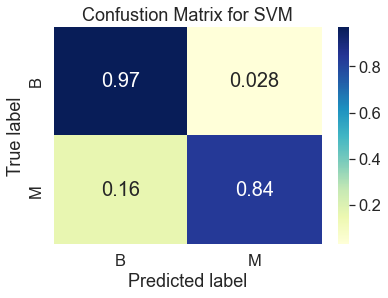

In [34]:
cm = confusion_matrix(Y_train, Y_SVM_train_pre, labels = ['B','M'])
cm_percent = cm / cm.sum(axis = 1).reshape(-1,1)
labels = ['B','M']

sns.heatmap(cm_percent, annot = True, cmap="YlGnBu", annot_kws = {'size' : 20},xticklabels = labels, yticklabels = labels)
plt.title("Confustion Matrix for SVM")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.savefig("output11")

## Random Forest

In [35]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

ran_tree = RandomForestClassifier()

clf_ran_tree = ran_tree.fit(X_train, Y_train)

#Predicition of Y test
Y_Ran_Tree_test_pre = ran_tree.predict(X_test)
#Create classfication report with dictionary output
cr_ran_tree_test = classification_report(Y_test,Y_Ran_Tree_test_pre, output_dict = True)


In [36]:
print(classification_report(Y_test, Y_Ran_Tree_test_pre))

              precision    recall  f1-score   support

           B       0.93      0.98      0.95       107
           M       0.97      0.88      0.92        64

    accuracy                           0.94       171
   macro avg       0.95      0.93      0.94       171
weighted avg       0.94      0.94      0.94       171



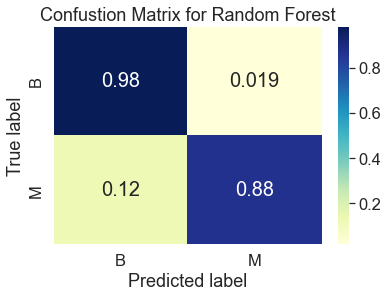

In [37]:
cm = confusion_matrix(Y_test, Y_Ran_Tree_test_pre, labels = ['B','M'])
cm_percent = cm / cm.sum(axis = 1).reshape(-1,1)
labels = ['B','M']

sns.heatmap(cm_percent, annot = True, cmap="YlGnBu", annot_kws = {'size' : 20},xticklabels = labels, yticklabels = labels)
plt.title("Confustion Matrix for Random Forest")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.savefig("output12")

Conduct Hyperparameter tuning to see if there is parameter better than current Random Forest algorithm

### Hyperparameter tuning

Hyperparameter tuning allows you to find the best parameter that can be applied to Random Forest algorithm. However, this will consume time

In [38]:
from sklearn.model_selection import GridSearchCV

parameters = {'n_estimators': (10,50,100,150,200,250),
             'criterion': ('gini', 'entropy'),
             'min_samples_split' : (5,10),
              'min_samples_leaf' : (5,10)
             }
clf_grid = GridSearchCV(estimator= ran_tree, param_grid = parameters, cv =10)

In [39]:
clf_grid.fit(X_train, Y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(),
             param_grid={'criterion': ('gini', 'entropy'),
                         'min_samples_leaf': (5, 10),
                         'min_samples_split': (5, 10),
                         'n_estimators': (10, 50, 100, 150, 200, 250)})

In [40]:
pd.DataFrame(clf_grid.cv_results_).T

,0,1,2,3,4,5,6,7,8,9,...,38,39,40,41,42,43,44,45,46,47
mean_fit_time,0.010624,0.045129,0.089159,0.131419,0.17779,0.220169,0.010178,0.045125,0.087165,0.129393,...,0.089827,0.133518,0.180287,0.224718,0.010244,0.045709,0.090116,0.137208,0.178863,0.220733
std_fit_time,0.000812,0.000945,0.002769,0.002478,0.002531,0.004126,0.000265,0.001287,0.00089,0.001245,...,0.001562,0.001776,0.002534,0.003238,0.000177,0.00107,0.001664,0.003638,0.002249,0.002848
mean_score_time,0.001555,0.003217,0.005323,0.007275,0.009584,0.011676,0.001472,0.003225,0.005079,0.007094,...,0.00556,0.007287,0.009606,0.011546,0.001451,0.003208,0.005285,0.007444,0.009298,0.011569
std_score_time,0.000171,0.000104,0.000136,0.00015,0.000584,0.000506,0.000063,0.000194,0.000079,0.000127,...,0.000505,0.00017,0.000665,0.000307,0.000076,0.000257,0.000161,0.000342,0.000116,0.000918
param_criterion,gini,gini,gini,gini,gini,gini,gini,gini,gini,gini,...,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy
param_min_samples_leaf,5,5,5,5,5,5,5,5,5,5,...,10,10,10,10,10,10,10,10,10,10
param_min_samples_split,5,5,5,5,5,5,10,10,10,10,...,5,5,5,5,10,10,10,10,10,10
param_n_estimators,10,50,100,150,200,250,10,50,100,150,...,100,150,200,250,10,50,100,150,200,250
params,"{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...","{'criterion': 'gini', 'min_samples_leaf': 5, '...",...,"{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1...","{'criterion': 'entropy', 'min_samples_leaf': 1..."
split0_test_score,0.95,0.975,0.975,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [41]:
clf_grid.best_estimator_
clf_grid.best_params_

{'criterion': 'entropy',
 'min_samples_leaf': 5,
 'min_samples_split': 5,
 'n_estimators': 100}

In [42]:
#Recreate model with parameter with highest average score
best_model_grid = clf_grid.best_estimator_
#Fit the model with best model
best_model_grid.fit(X_train, Y_train)

#Predicition of Y test
Y_Ran_Tree_Grid_test_pre = best_model_grid.predict(X_test)
#Create classification report for this model
ran_tree_grid_test = classification_report(Y_test,Y_Ran_Tree_Grid_test_pre, output_dict = True)

#Compare the classification report of Random Forest and Hyperparameter tuning
print(classification_report(Y_test, Y_Ran_Tree_Grid_test_pre))
print(classification_report(Y_test, Y_Ran_Tree_test_pre))

              precision    recall  f1-score   support

           B       0.93      0.98      0.95       107
           M       0.97      0.88      0.92        64

    accuracy                           0.94       171
   macro avg       0.95      0.93      0.94       171
weighted avg       0.94      0.94      0.94       171

              precision    recall  f1-score   support

           B       0.93      0.98      0.95       107
           M       0.97      0.88      0.92        64

    accuracy                           0.94       171
   macro avg       0.95      0.93      0.94       171
weighted avg       0.94      0.94      0.94       171



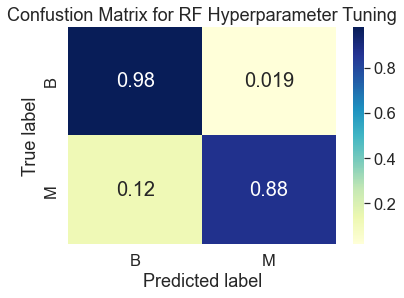

In [43]:
cm = confusion_matrix(Y_test, Y_Ran_Tree_Grid_test_pre, labels = ['B','M'])
cm_percent = cm / cm.sum(axis = 1).reshape(-1,1)
labels = ['B','M']

sns.heatmap(cm_percent, annot = True, cmap="YlGnBu", annot_kws = {'size' : 20},xticklabels = labels, yticklabels = labels)
plt.title("Confustion Matrix for RF Hyperparameter Tuning")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.savefig("output13")
plt.show()

## Feature Importance

Now check which feature has high importance to the lgorithm Random Forest Hyerparameter tunning.

In [44]:
f_imp = pd.Series(best_model_grid.feature_importances_, index = X_test.columns).sort_values(ascending=False)

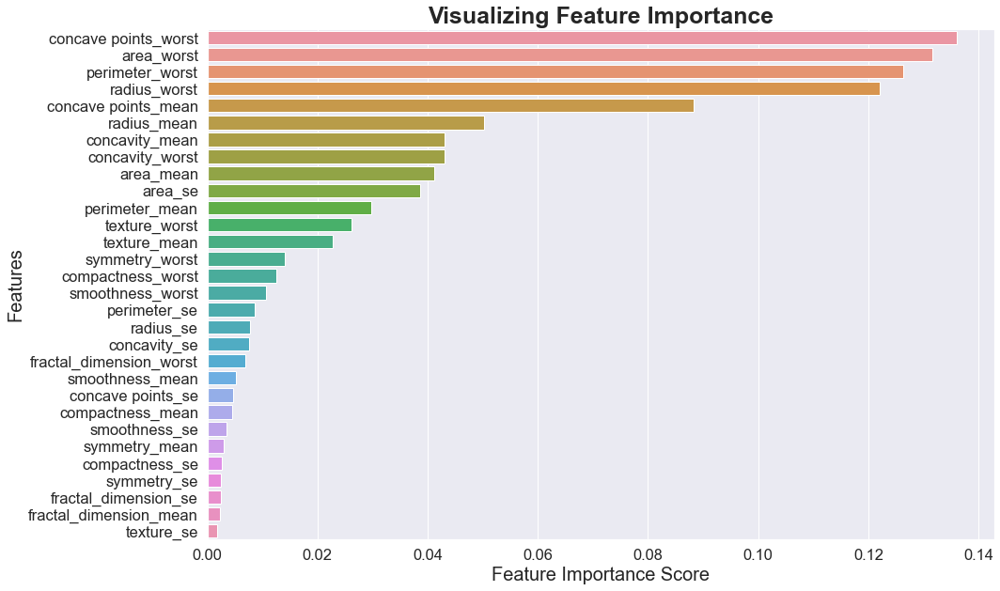

In [45]:
plt.figure(figsize = (15,10))
sns.barplot(x = f_imp, y = f_imp.index)
plt.title("Visualizing Feature Importance", fontsize = '25', weight = 'bold')
plt.ylabel('Features', fontsize = '20')
plt.xlabel('Feature Importance Score', fontsize = '20')
plt.savefig("output14")
plt.show()

We can see that " concave points_worst" has highest feature importance.<br>
This graph does not tell which feature is imporance to the classification result.
Therefore, we will use SHAP to dig deeper to understand how feature is important to classification result

In [46]:
import shap
explainer = shap.TreeExplainer(best_model_grid)
shap_obj = explainer(X_test)
shap_values = explainer.shap_values(X_test)


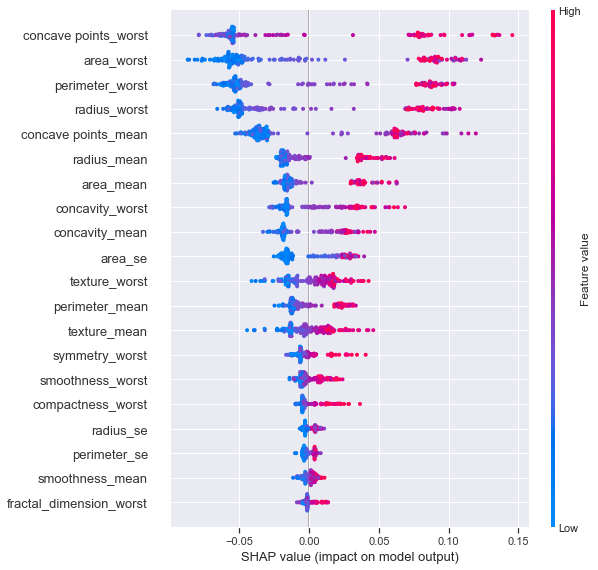

<Figure size 432x288 with 0 Axes>

In [47]:
shap.summary_plot(shap_values[1], X_test, show = False)
plt.show()
plt.savefig('output15.png')

with SHAP dependence_plot, we can see the relationship of SHAP value with 'area_worst' values

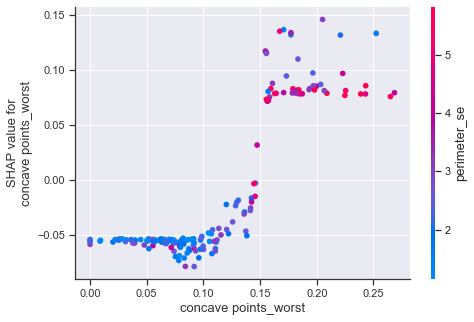

In [51]:
shap.dependence_plot('concave points_worst', shap_values[1], X_test, dot_size=32, show=False)
plt.savefig("output16")

# Conclusion

In [49]:
def Merge(dict1 = {}, dict2 = {}):
    #Merge: Merge two dictionary and return merged dictionary
    #dict1: dictionary data
    #dict2: dictionary data
    #Return: dictionary data
    
    
    #Unzip the dictionary data into dictionary data 3
    dict3 = {**dict1, **dict2}
    
    #Loop dict3
    for key, value in dict3.items():
        if key in dict1 and key in dict2:
            #If the data from dictionary has no list data in dictionary value of dict1 and dict2
            if (isinstance(dict1.get(key), list) or isinstance(dict2.get(key), list)) == False:
                testlist= []
                testlist.append(dict1.get(key))
                testlist.append(dict2.get(key))
                dict3[key] = testlist
                
            #If value of dict1[key] has a list
            elif (isinstance(dict1.get(key), list)) == True:
                dict3[key] = dict1[key]
                dict3.get(key).append(value)
                
            #If value of dict2[key] has a list
            elif (isinstance(dict2.get(key), list)) == True:
                dict3[key] = dict2[key]
                dict3.get(key).append(value)
    
    #Return dictionary data
    return dict3

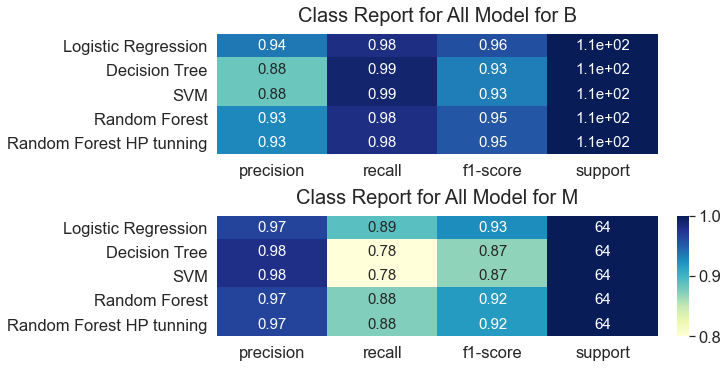

In [50]:

t_data_B = Merge( Merge( Merge( Merge(cr_log_test['B'], cr_SVM_test['B']), cr_SVM_test['B']), cr_ran_tree_test['B']), ran_tree_grid_test['B'])
t_data_M = Merge( Merge( Merge( Merge(cr_log_test['M'], cr_SVM_test['M']), cr_SVM_test['M']), cr_ran_tree_test['M']), ran_tree_grid_test['M'])
cr_ran_tree_test
ran_tree_grid_test
df_B = pd.DataFrame(t_data_B)
df_M = pd.DataFrame(t_data_M)

f, (ax1, ax2) = plt.subplots(nrows= 2, ncols= 1, figsize =(10, 5), constrained_layout=True, sharey=True)
label_Model = ['Logistic Regression','Decision Tree', 'SVM','Random Forest', 'Random Forest HP tunning']
data_B_heatmap = sns.heatmap(df_B, annot = True, cmap="YlGnBu", vmin =0.8, vmax = 1, ax =ax1, cbar=False, 
                             annot_kws = {'size' : 15}, xticklabels = df_B.columns, yticklabels = label_Model)
data_B_heatmap.set_title('Class Report for All Model for B', fontdict = {'fontsize':20}, pad = 12)

data_M_heatmap = sns.heatmap(df_M, annot = True, cmap="YlGnBu", vmin =0.8, vmax = 1, ax = ax2,
                             annot_kws = {'size' : 15}, xticklabels = df_B.columns, yticklabels = label_Model)
data_M_heatmap.set_title('Class Report for All Model for M', fontdict = {'fontsize':20}, pad = 12)
plt.plot()
plt.savefig("output17")

We can see that Logisitc Regression has the highest score with diagnosis result with M and B.<br>
Therefore, Logisitic Regression will be the best model for this case.